# Домашнее задание

# 1 - Уменьшение палитры изображения (суммарно 6 баллов)
Для <a href='https://thumbs.dreamstime.com/x/two-lorikeet-birds-2293918.jpg'> картинки </a> нужно уменьшить число цветов в палитре.

Для этого нужно выделить **кластеры в пространстве RGB**, объекты соответствуют пикселям изображения. После выделения кластеров, все пиксели, отнесенные в один кластер, заполняются одним цветом; этот цвет может быть центроидом соответствующего кластера, медианным цветом по кластеру.

Попробуйте различные алгоритмы кластеризации:

* KMeans
* DBSCAN
* AgglomerativeClustering

Рассмотрите число кластеров K = 2, 3, 10, 20 (в алгоритмах, где есть такой гиперпараметр).

Для различных кластеризаций оцените и сравните потери от уменьшения цветов при помощи метрики 
<a href='http://scikit-image.org/docs/dev/api/skimage.measure.html#skimage.measure.compare_ssim'> SSIM </a>. Какой способ оказался лучшим?

Задание оценивает в 5 баллов.

Еще 1 балл даётся за запуск алгоритма на выбранных вами картинках - на них результат должен получиться красивым.

Вот вам вспомогательные функции для считывания и вывода изображений:

In [104]:
import matplotlib.pyplot as plt
import cv2 # нужно поставить себе cv2 через conda install opencv
import numpy as np

def draw_picture(image, bgr=False):
    b, g, r = cv2.split(image) # по умолчанию cv2 почему-то отдает цвета в порядке BGR вместо RGB
    new_image = cv2.merge([r, g, b])
    plt.figure(figsize=(7, 5))
    plt.axis('off')
    plt.imshow(new_image)
    plt.show()

img - это обычный трехмерный массив цветов пикселей, где две первые координаты - это координаты каждого пикселя, и третья обозначает R, G или B.

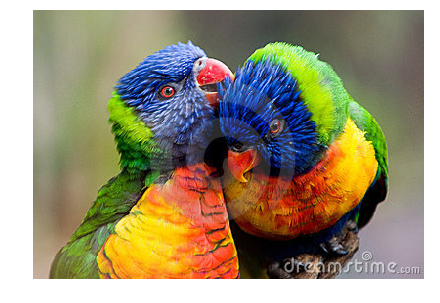

In [105]:
img = cv2.imread('birds.jpg') # считать картинку
draw_picture(img) # нарисовать картинку

In [106]:
img.shape

(275, 400, 3)

In [107]:
import warnings
warnings.filterwarnings('ignore')

In [108]:
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AgglomerativeClustering

cluster_size_data = [2, 3, 10, 20]

In [109]:
from collections import Counter

def create_new_image(img, model) :
    X = img.reshape(img.shape[0]*img.shape[1], 3)
    y_pred = model.fit_predict(X)
    
    n_clusters = len(Counter(y_pred))
    colors = np.zeros((n_clusters, 3)) #BGR
    for cl in range(n_clusters) :
        for i in range(3) :
            colors[cl, i] = np.mean(X[y_pred == cl, i])

    X_new = np.zeros((len(X), 3))
    for i in range(len(X_new)) :
        cluster = y_pred[i]
        B = colors[cluster, 0]
        G = colors[cluster, 1]
        R = colors[cluster, 2]
        X_new[i] = np.array([B, G, R])
        
    X_new_int = X_new.astype(int)
    new_img = X_new_int.reshape(img.shape[0], img.shape[1], 3)
    
    return new_img

In [110]:
def draw_pictures(images, label=None):
    plt.figure(figsize=(15, 10))
    img_count = len(images)
    
    for i in range(img_count) :
        image = images[i]
        b, g, r = cv2.split(image)
        new_image = cv2.merge([r, g, b])
        plt.subplot(220 + i + 1)
        plt.axis('off')
        plt.imshow(new_image)
        if (img_count == 2) & (i == 1) :
            plt.title(label)
        else :
            plt.title(str(i + 1))
    
    plt.show()

In [111]:
from skimage.measure import compare_ssim as ssim

def show_ssim(img, new_img, label='new img') :
    draw_pictures([img, new_img], label);
    print('SSIM(original image, {}) = {}'.format(label, ssim(img, new_img, multichannel=True)))

In [112]:
KMeans_images = np.array([None, None, None, None])

for i in range(4) :
    n_clusters = cluster_size_data[i]
    KMeans_images[i] = create_new_image(img, KMeans(n_clusters=n_clusters))

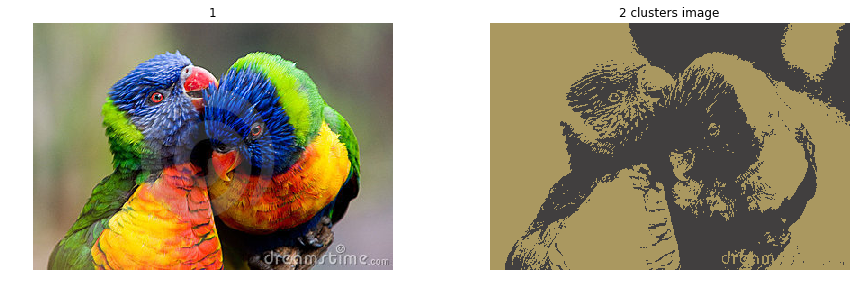

SSIM(original image, 2 clusters image) = 0.5332563165614852


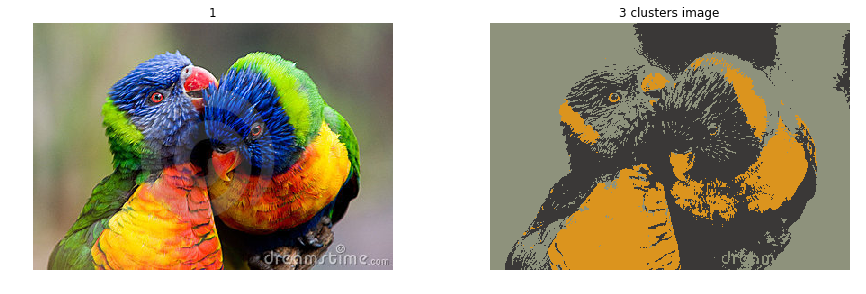

SSIM(original image, 3 clusters image) = 0.5634940373793377


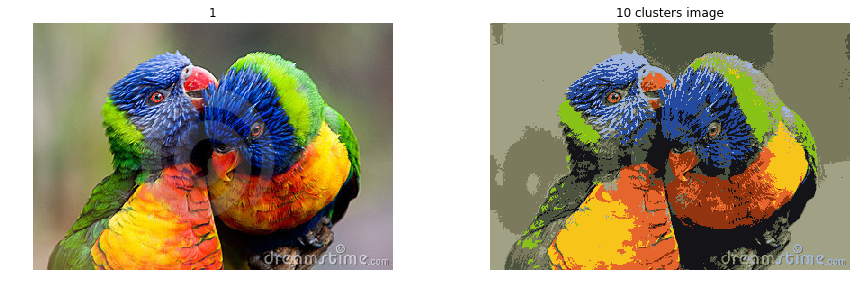

SSIM(original image, 10 clusters image) = 0.6790618740494553


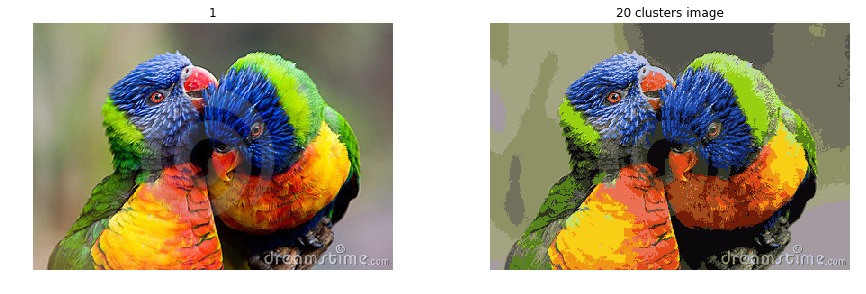

SSIM(original image, 20 clusters image) = 0.7560652882328945


In [113]:
for i in range(len(KMeans_images)) :
    show_ssim(img, KMeans_images[i], str(cluster_size_data[i]) + ' clusters image')

In [114]:
beach_img = cv2.imread('beach_small.jpg')

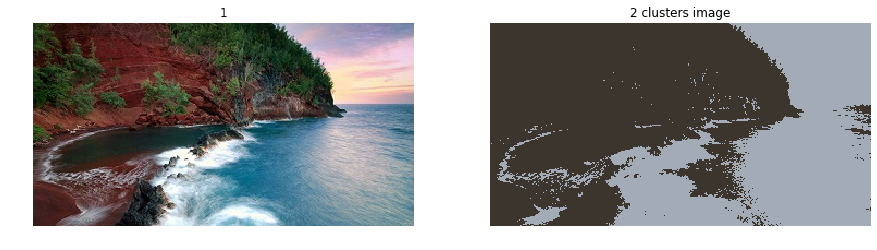

SSIM(original image, 2 clusters image) = 0.39273134929110015


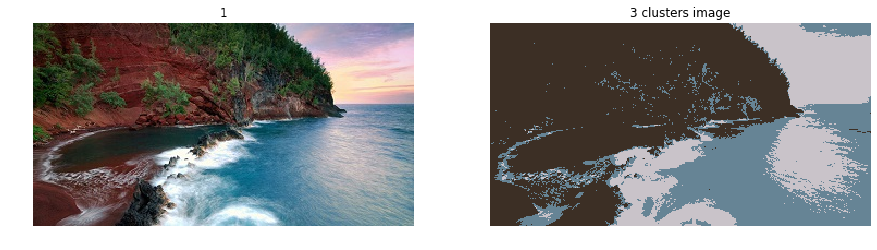

SSIM(original image, 3 clusters image) = 0.4822618243542603


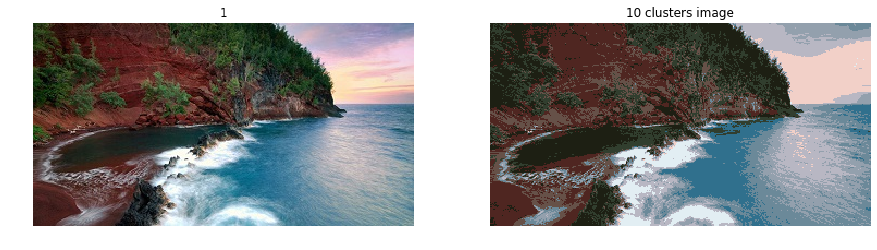

SSIM(original image, 10 clusters image) = 0.7582392808215411


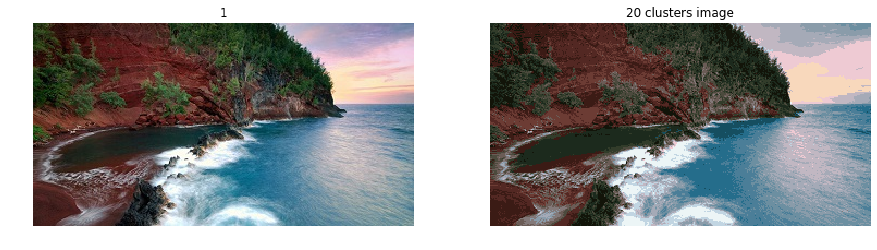

SSIM(original image, 20 clusters image) = 0.8490863554347555


In [115]:
KMeans_beach_images = np.array([None, None, None, None])

for i in range(4) :
    n_clusters = cluster_size_data[i]
    KMeans_beach_images[i] = create_new_image(beach_img, KMeans(n_clusters=n_clusters))
    
for i in range(len(KMeans_beach_images)) :
    show_ssim(beach_img, KMeans_beach_images[i], str(cluster_size_data[i]) + ' clusters image')

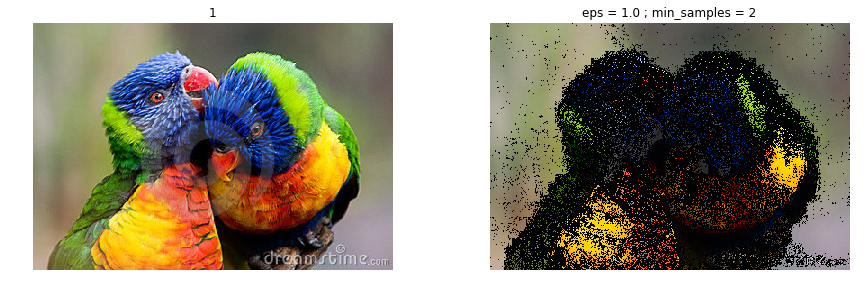

SSIM(original image, eps = 1.0 ; min_samples = 2) = 1.8425758477173726


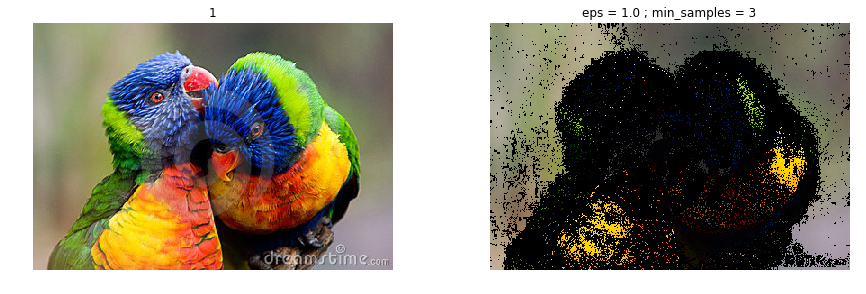

SSIM(original image, eps = 1.0 ; min_samples = 3) = -0.03880835716395125


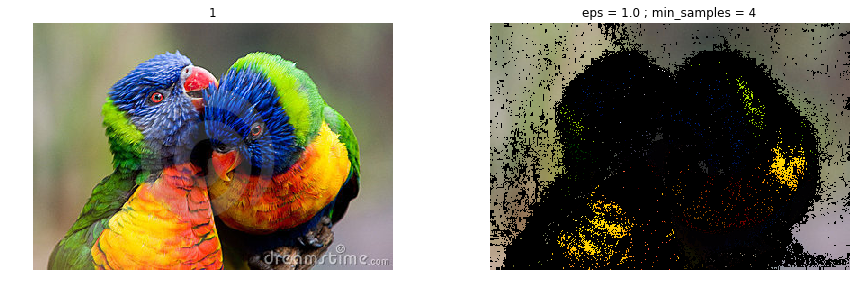

SSIM(original image, eps = 1.0 ; min_samples = 4) = -0.8663792725707764


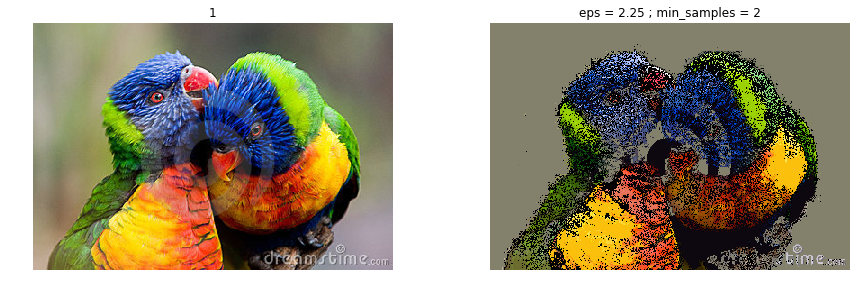

SSIM(original image, eps = 2.25 ; min_samples = 2) = 1.4442976826972664


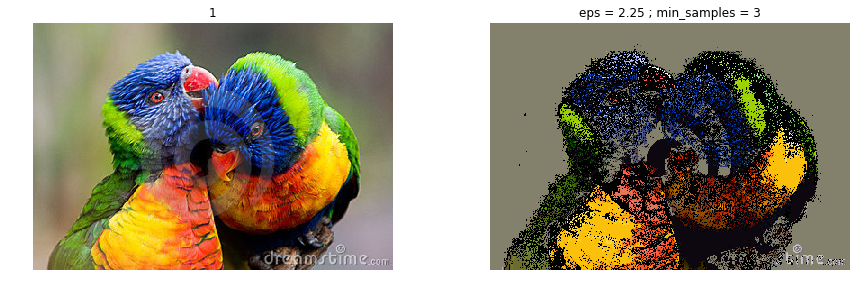

SSIM(original image, eps = 2.25 ; min_samples = 3) = 0.17426127978081185


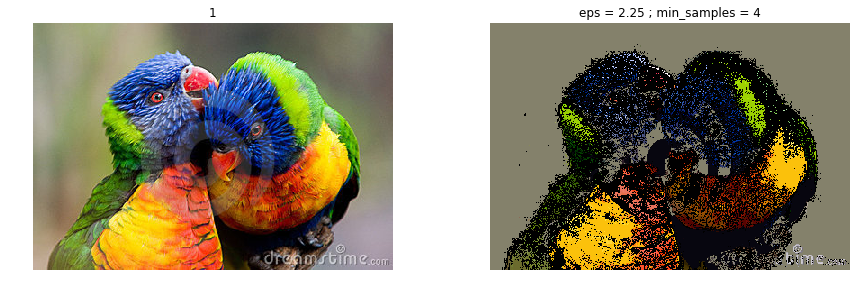

SSIM(original image, eps = 2.25 ; min_samples = 4) = -4.294903580038169


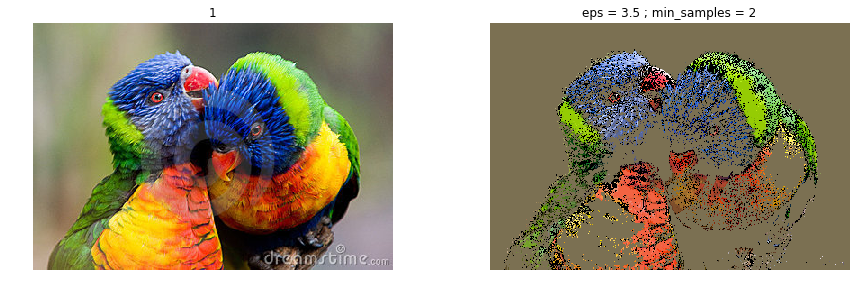

SSIM(original image, eps = 3.5 ; min_samples = 2) = 1.2885955592351885


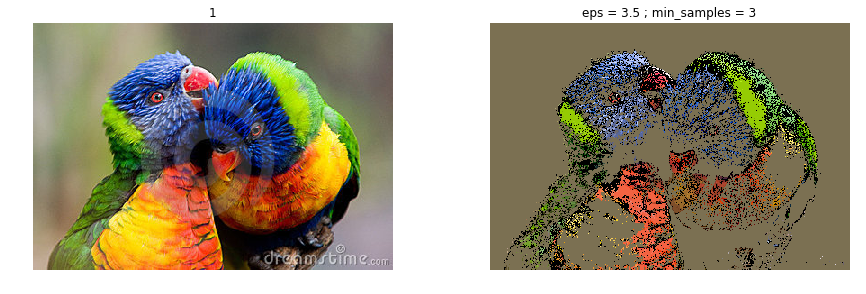

SSIM(original image, eps = 3.5 ; min_samples = 3) = -5.216688528326519


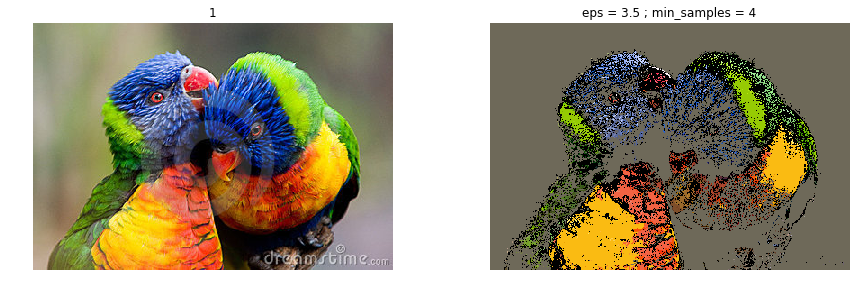

SSIM(original image, eps = 3.5 ; min_samples = 4) = -22.29376319486615


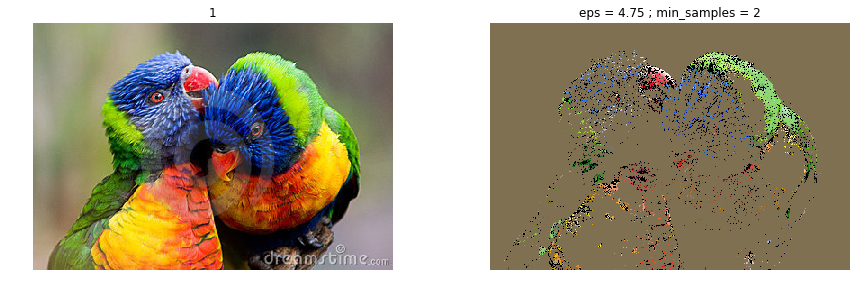

SSIM(original image, eps = 4.75 ; min_samples = 2) = 0.6733641299431246


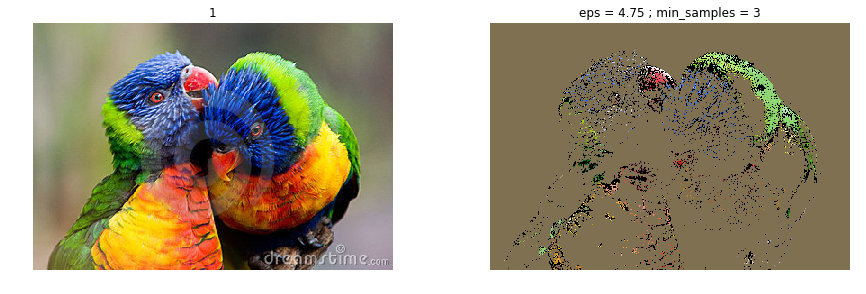

SSIM(original image, eps = 4.75 ; min_samples = 3) = -0.3127476760879922


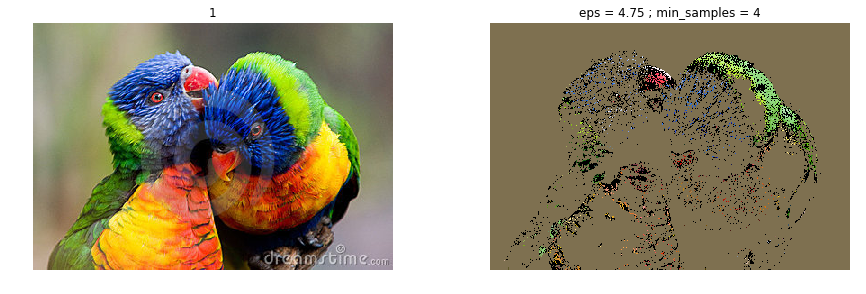

SSIM(original image, eps = 4.75 ; min_samples = 4) = 2.3972385379825543


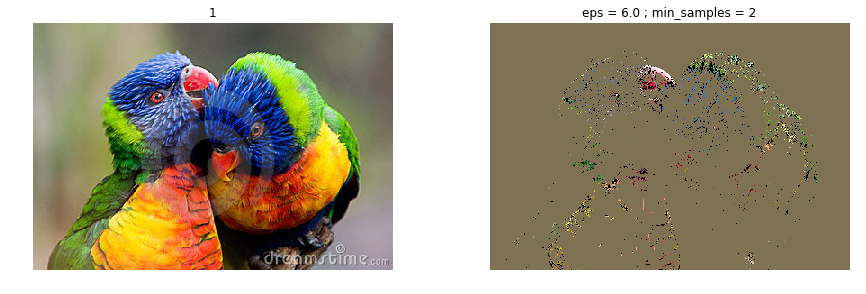

SSIM(original image, eps = 6.0 ; min_samples = 2) = 66.98684697970991


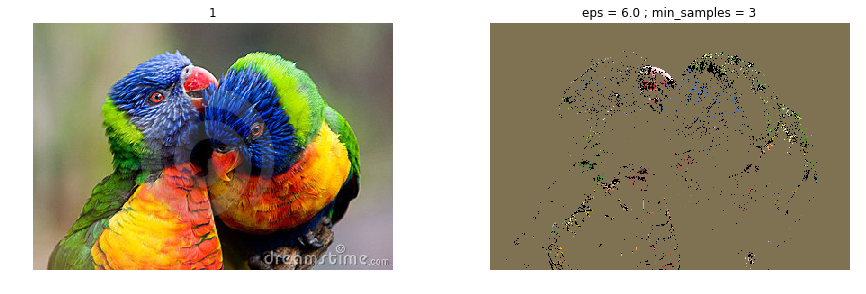

SSIM(original image, eps = 6.0 ; min_samples = 3) = 1.7179099361700312


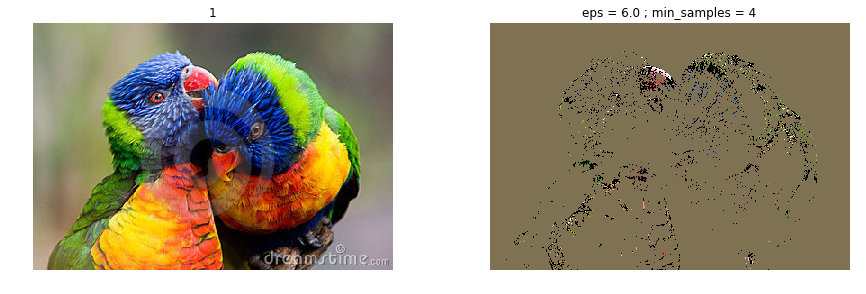

SSIM(original image, eps = 6.0 ; min_samples = 4) = 3.264374699031667


In [116]:
epss_size_data = np.linspace(1.0, 6.0, 5)
min_samples_size_data = np.array([2, 3, 4])


for i in range(len(epss_size_data)) :
    for j in range(len(min_samples_size_data)) :
        eps = epss_size_data[i]
        min_samples = min_samples_size_data[j]
        new_img = create_new_image(img, DBSCAN(eps=eps, min_samples=min_samples))
        show_ssim(img, new_img, 'eps = {} ; min_samples = {}'.format(eps, min_samples))
    
    
    


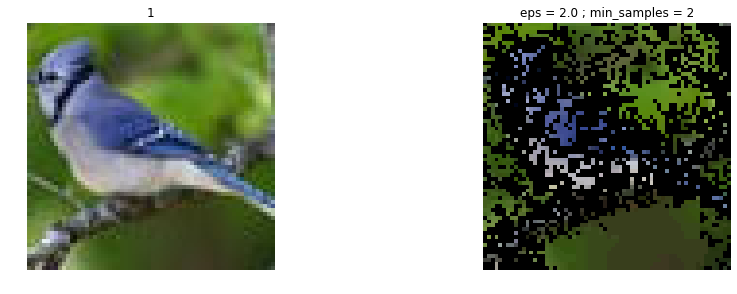

SSIM(original image, eps = 2.0 ; min_samples = 2) = 4.329737418596126e-19


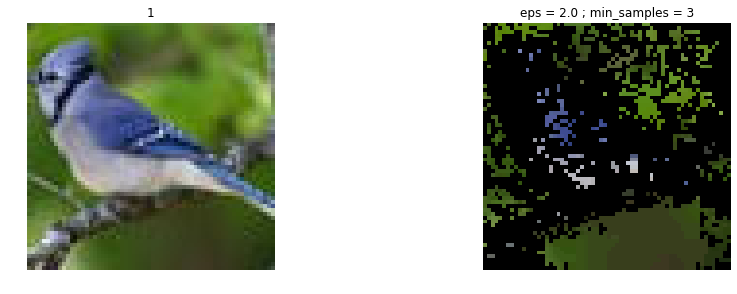

SSIM(original image, eps = 2.0 ; min_samples = 3) = 0.37030389740318786


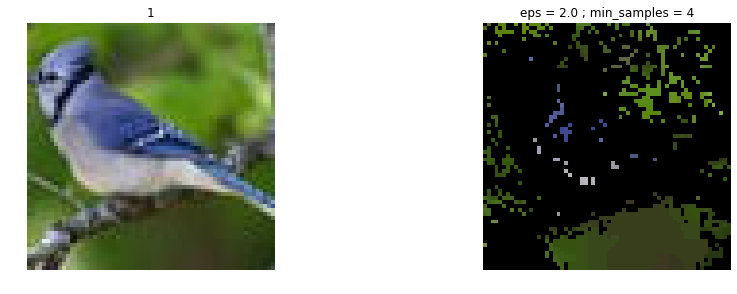

SSIM(original image, eps = 2.0 ; min_samples = 4) = -3.1084697399282624e-17


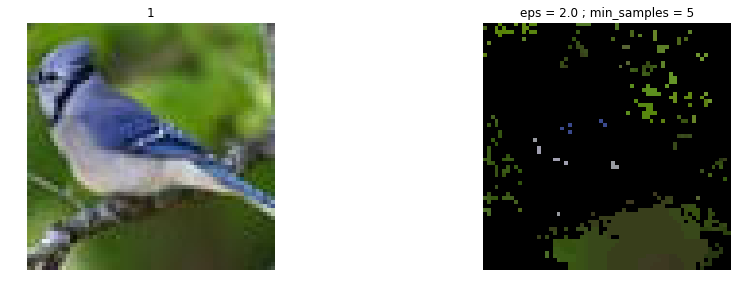

SSIM(original image, eps = 2.0 ; min_samples = 5) = -0.049383976306689725


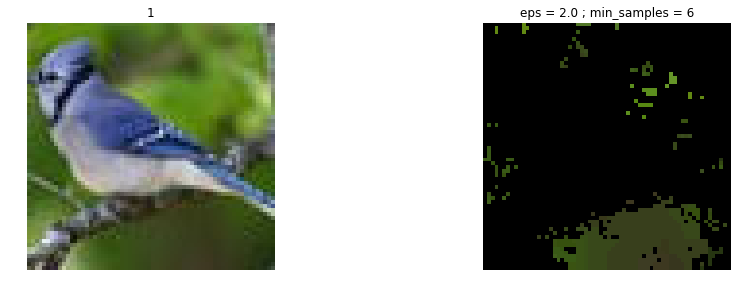

SSIM(original image, eps = 2.0 ; min_samples = 6) = -0.224112280964764


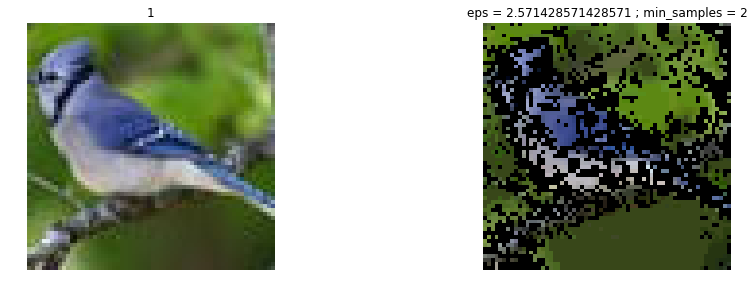

SSIM(original image, eps = 2.571428571428571 ; min_samples = 2) = -0.368153418904354


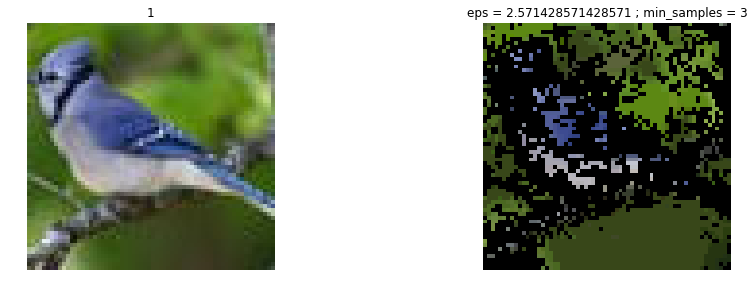

SSIM(original image, eps = 2.571428571428571 ; min_samples = 3) = 9.089828899931406e-19


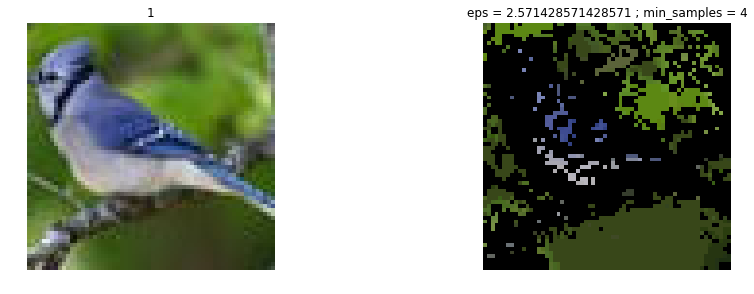

SSIM(original image, eps = 2.571428571428571 ; min_samples = 4) = -6.307317891620423e-18


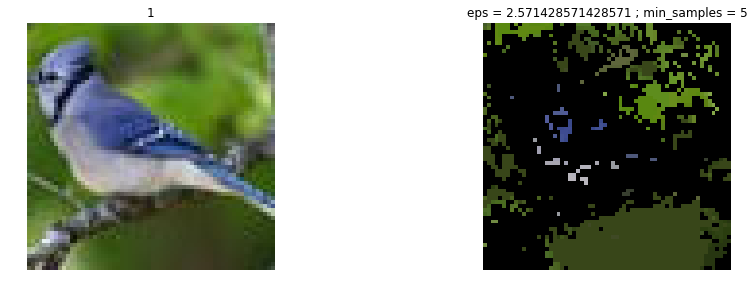

SSIM(original image, eps = 2.571428571428571 ; min_samples = 5) = 1.405555609414996e-17


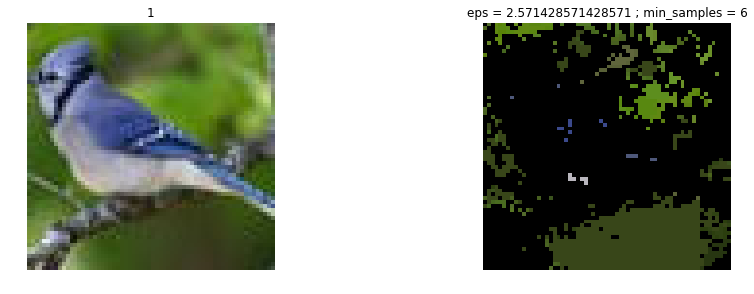

SSIM(original image, eps = 2.571428571428571 ; min_samples = 6) = 1.0296529788027634e-16


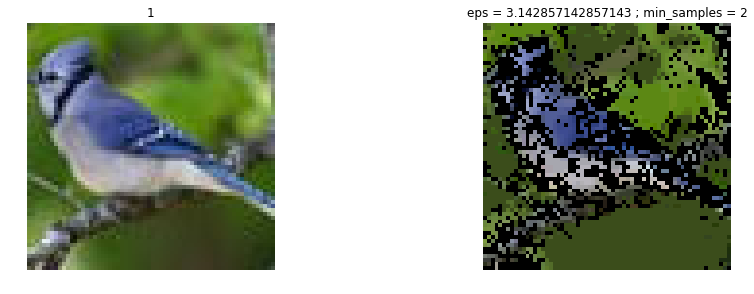

SSIM(original image, eps = 3.142857142857143 ; min_samples = 2) = -2.995177175513137e-19


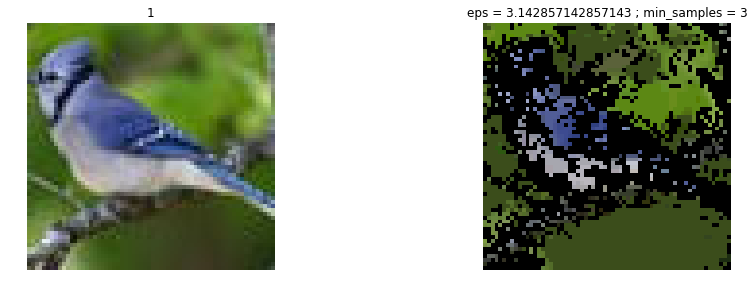

SSIM(original image, eps = 3.142857142857143 ; min_samples = 3) = -3.27724973909128e-19


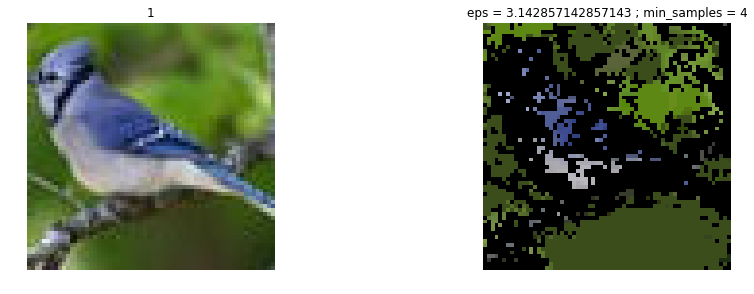

SSIM(original image, eps = 3.142857142857143 ; min_samples = 4) = -8.273453855612939e-19


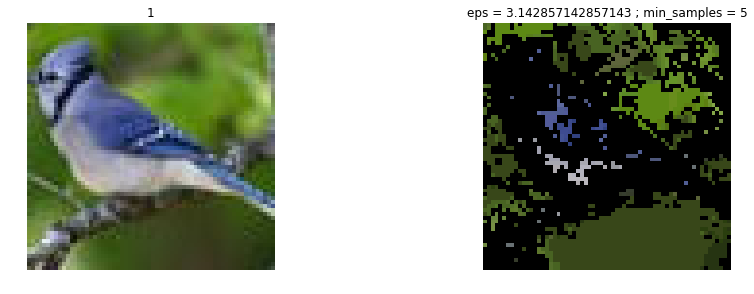

SSIM(original image, eps = 3.142857142857143 ; min_samples = 5) = -1.474349559585451e-17


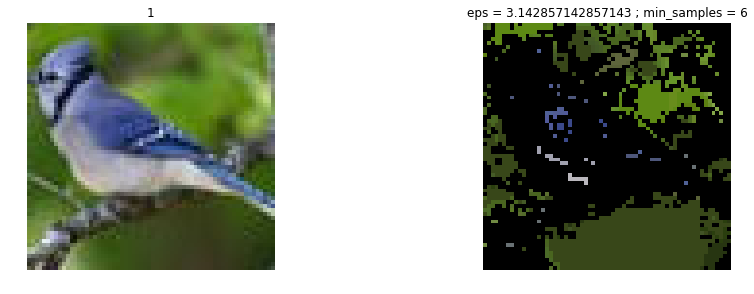

SSIM(original image, eps = 3.142857142857143 ; min_samples = 6) = 9.485137831015157e-17


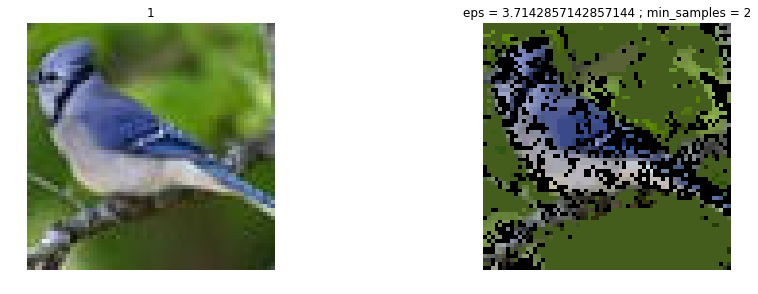

SSIM(original image, eps = 3.7142857142857144 ; min_samples = 2) = -0.05325048982058799


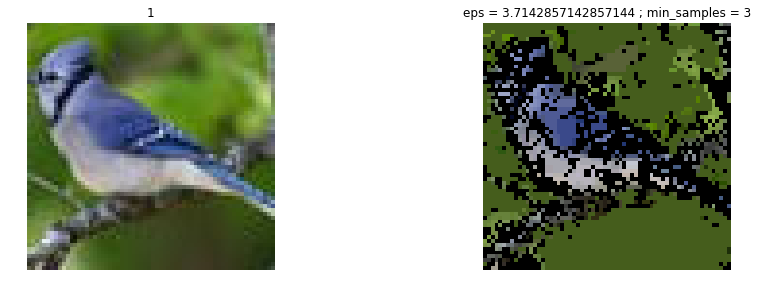

SSIM(original image, eps = 3.7142857142857144 ; min_samples = 3) = 2.793663928239425e-19


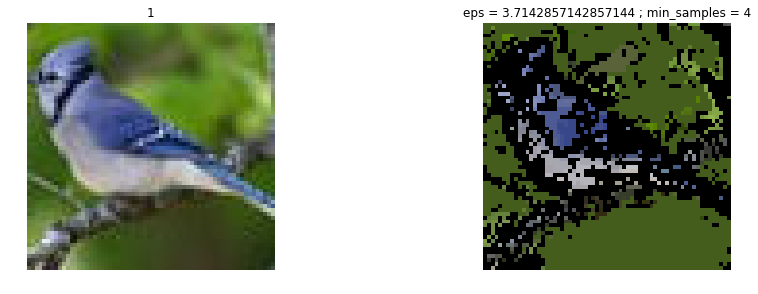

SSIM(original image, eps = 3.7142857142857144 ; min_samples = 4) = 1.5688774730832362


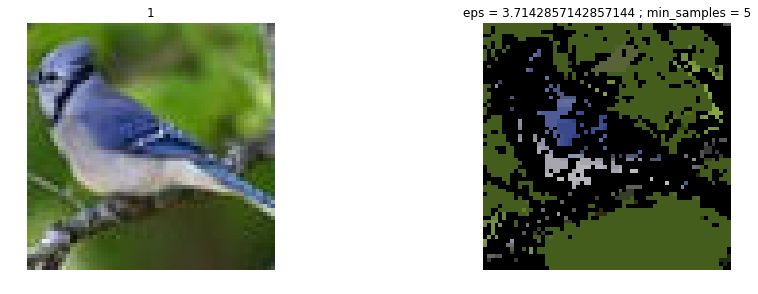

SSIM(original image, eps = 3.7142857142857144 ; min_samples = 5) = 5.628889393605955e-18


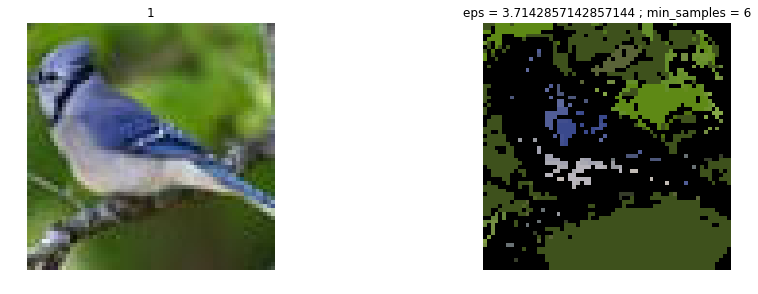

SSIM(original image, eps = 3.7142857142857144 ; min_samples = 6) = -0.13139091534601674


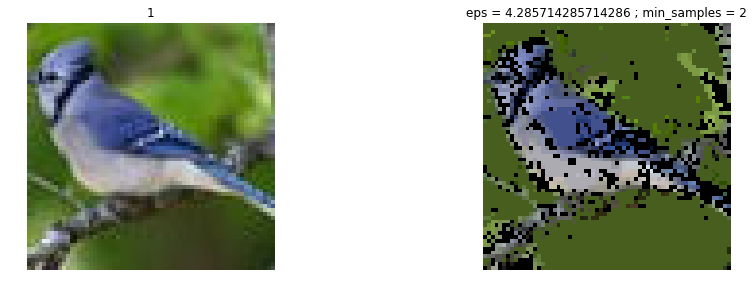

SSIM(original image, eps = 4.285714285714286 ; min_samples = 2) = -0.09321971656686745


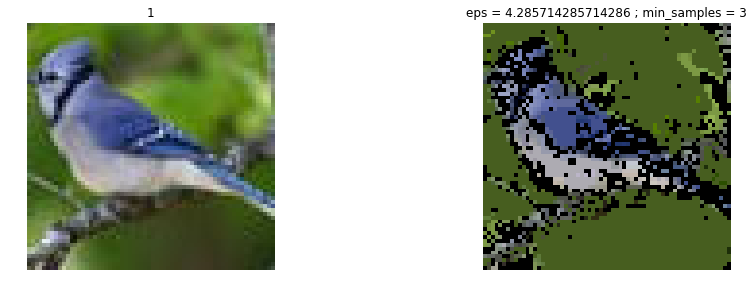

SSIM(original image, eps = 4.285714285714286 ; min_samples = 3) = 0.9568655868052768


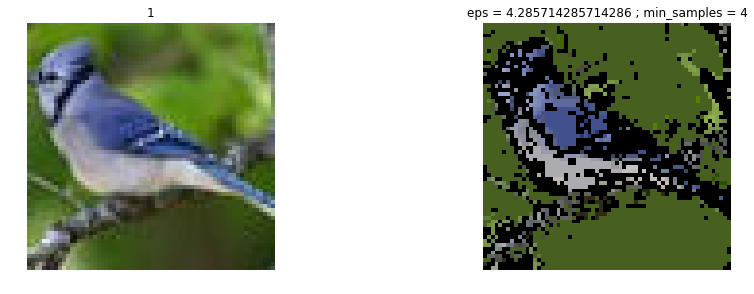

SSIM(original image, eps = 4.285714285714286 ; min_samples = 4) = -0.7902885212358837


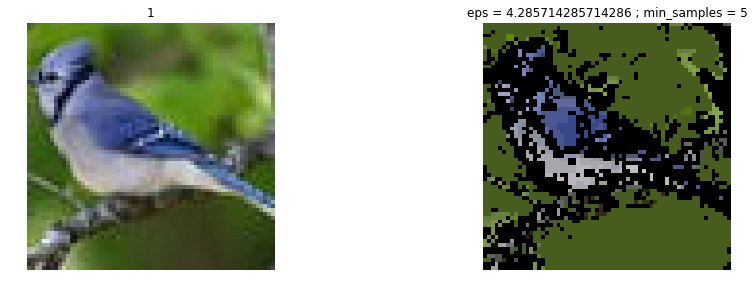

SSIM(original image, eps = 4.285714285714286 ; min_samples = 5) = -0.5289962906591036


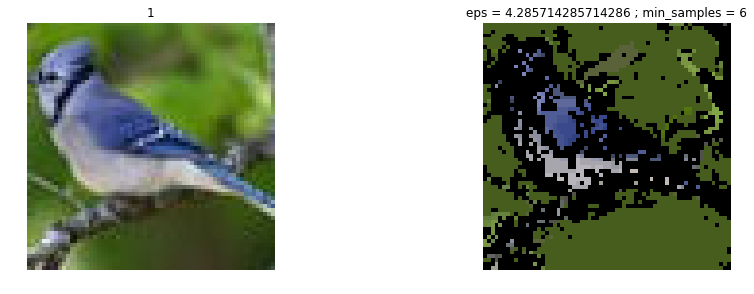

SSIM(original image, eps = 4.285714285714286 ; min_samples = 6) = 7.296574304558983


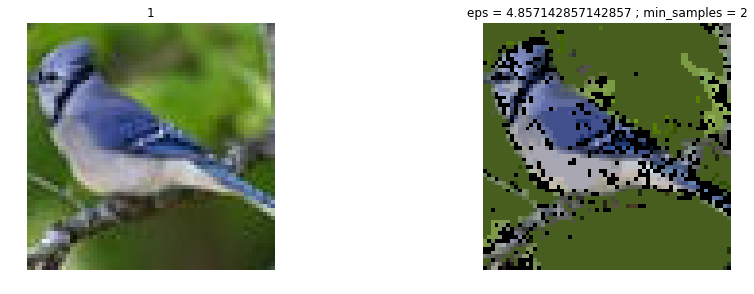

SSIM(original image, eps = 4.857142857142857 ; min_samples = 2) = -0.3676316607689751


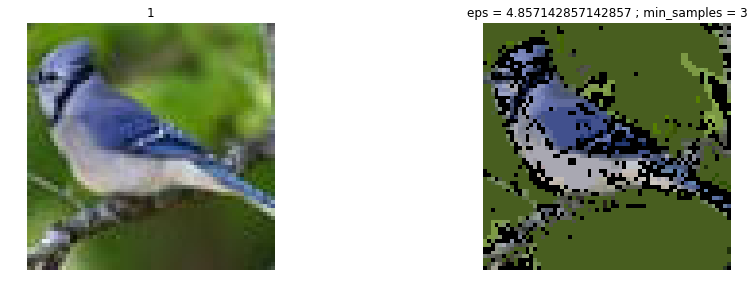

SSIM(original image, eps = 4.857142857142857 ; min_samples = 3) = 1.1178755326985372


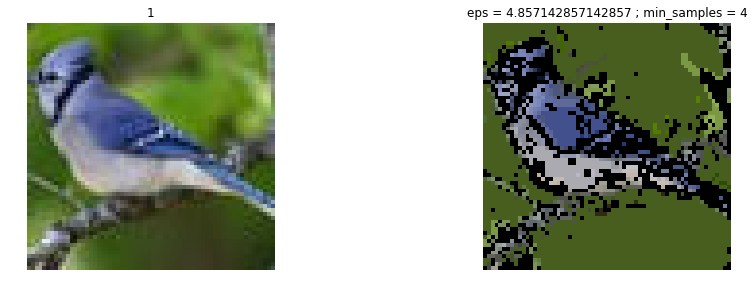

SSIM(original image, eps = 4.857142857142857 ; min_samples = 4) = -0.477452506954074


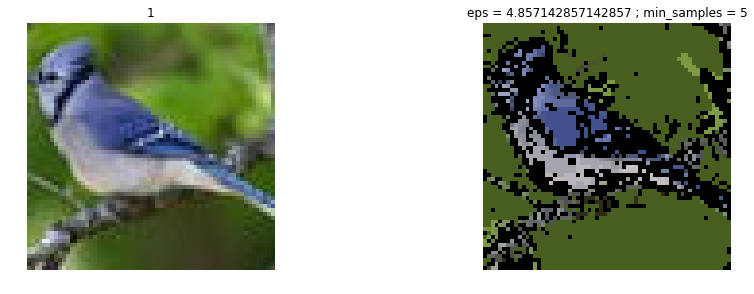

SSIM(original image, eps = 4.857142857142857 ; min_samples = 5) = -0.03025816372798441


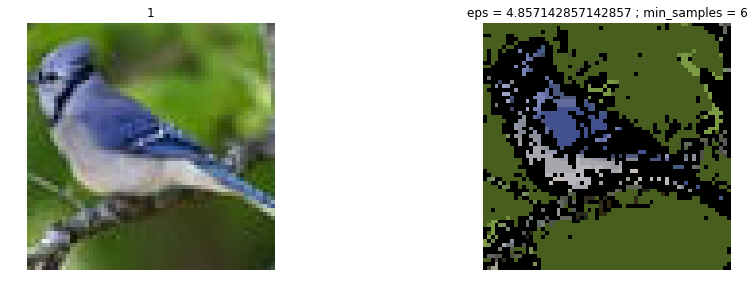

SSIM(original image, eps = 4.857142857142857 ; min_samples = 6) = -1.2463180387964392


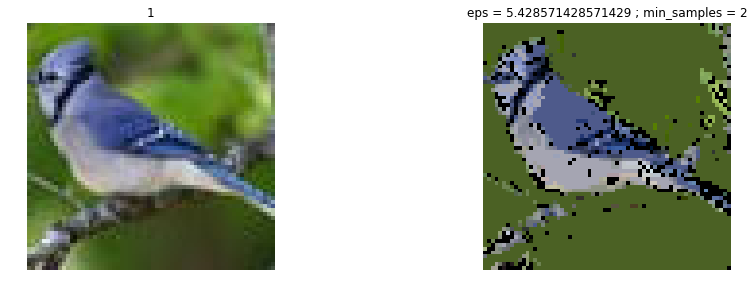

SSIM(original image, eps = 5.428571428571429 ; min_samples = 2) = -2.0010960269097775


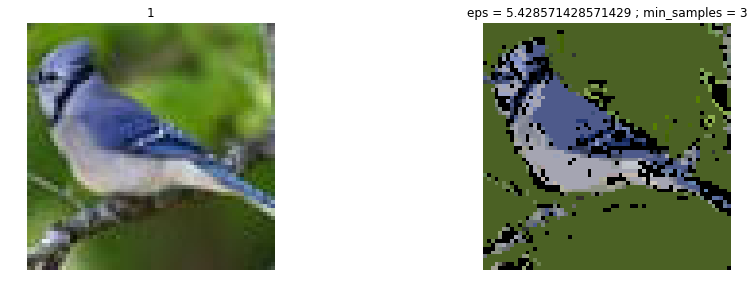

SSIM(original image, eps = 5.428571428571429 ; min_samples = 3) = -0.17876545819499293


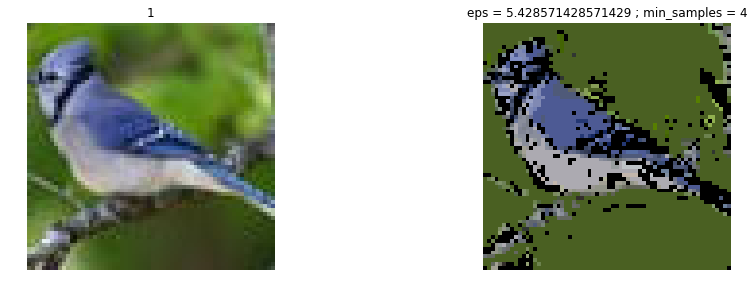

SSIM(original image, eps = 5.428571428571429 ; min_samples = 4) = 0.24237737380895089


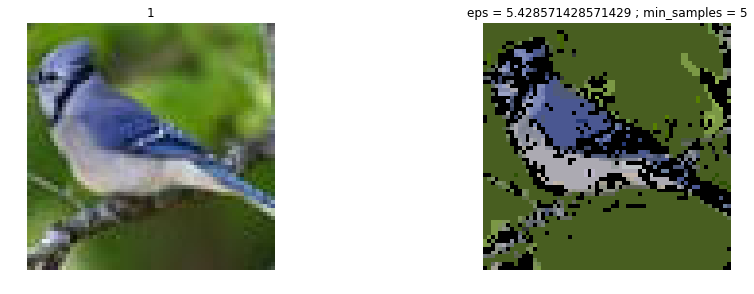

SSIM(original image, eps = 5.428571428571429 ; min_samples = 5) = -0.06280286319216181


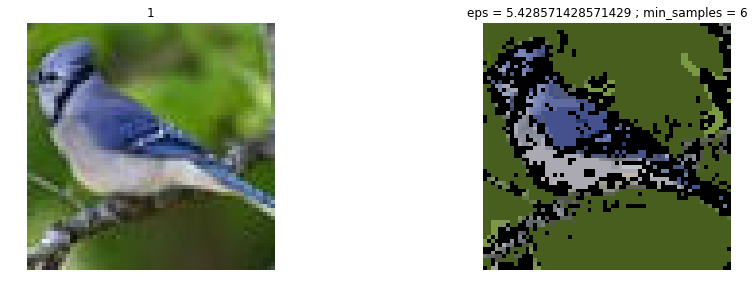

SSIM(original image, eps = 5.428571428571429 ; min_samples = 6) = -0.07183776097611978


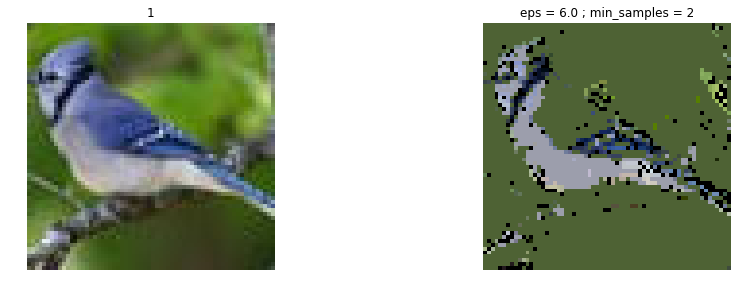

SSIM(original image, eps = 6.0 ; min_samples = 2) = 0.23348794627105285


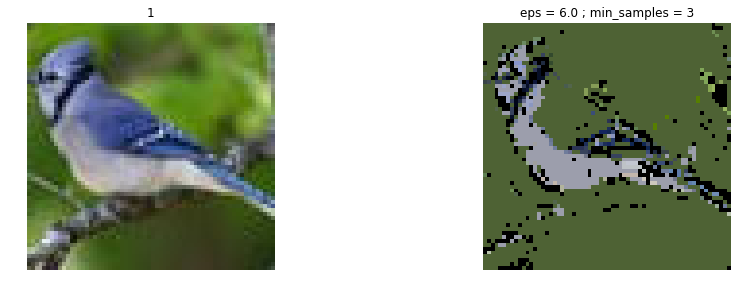

SSIM(original image, eps = 6.0 ; min_samples = 3) = 0.07618466431027017


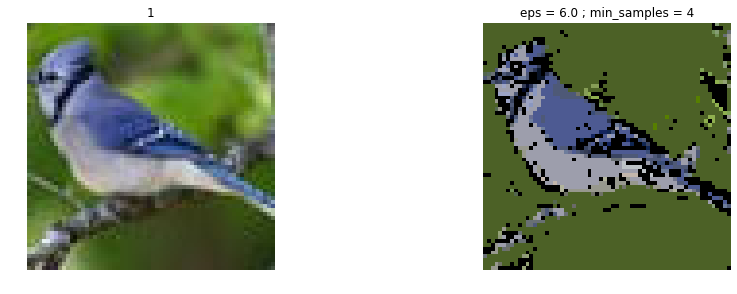

SSIM(original image, eps = 6.0 ; min_samples = 4) = -0.16720661425996355


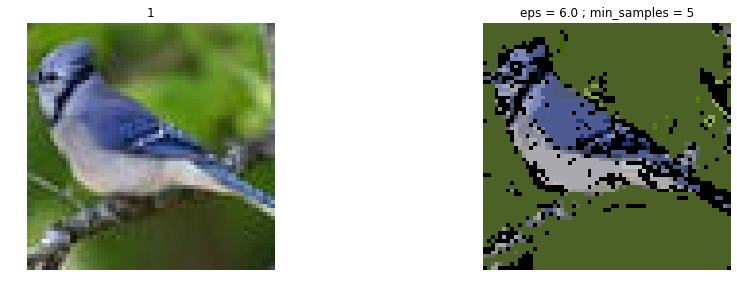

SSIM(original image, eps = 6.0 ; min_samples = 5) = 0.6309371330444329


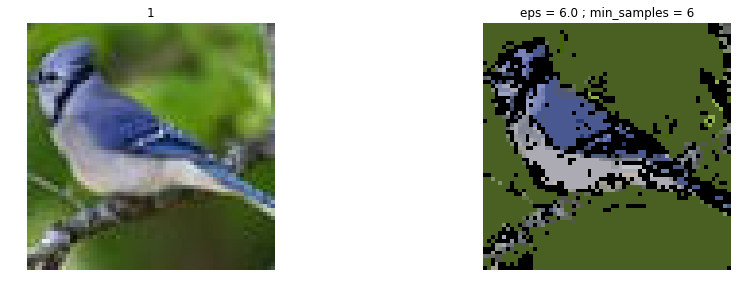

SSIM(original image, eps = 6.0 ; min_samples = 6) = -0.10530097983724558


In [118]:

small_bird_img = cv2.imread('small_bird.jpg')
epss_size_data = np.linspace(2.0, 6.0, 8)
min_samples_size_data = np.array([2, 3, 4, 5, 6])

#draw_picture(create_new_image(img, DBSCAN(eps=2.0, min_samples=3)))

for i in range(len(epss_size_data)) :
    for j in range(len(min_samples_size_data)) :
        eps = epss_size_data[i]
        min_samples = min_samples_size_data[j]
        new_img = create_new_image(small_bird_img, DBSCAN(eps=eps, min_samples=min_samples))
        show_ssim(small_bird_img, new_img, 'eps = {} ; min_samples = {}'.format(eps, min_samples))
    
    
    


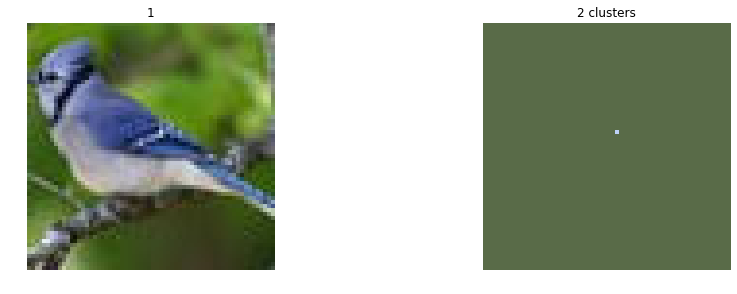

SSIM(original image, 2 clusters) = 0.21773080831423094


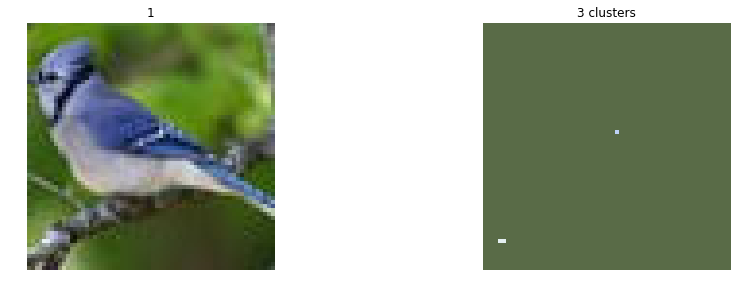

SSIM(original image, 3 clusters) = 0.2230584750292343


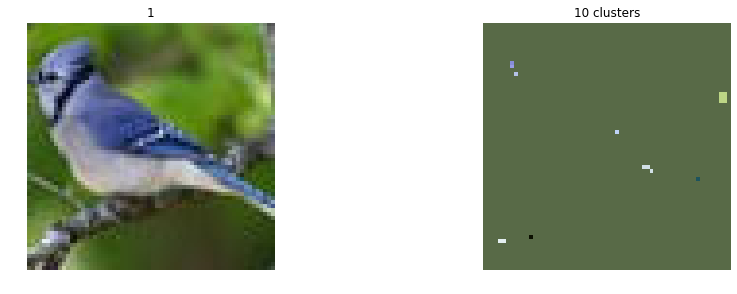

SSIM(original image, 10 clusters) = 0.23772765205891663


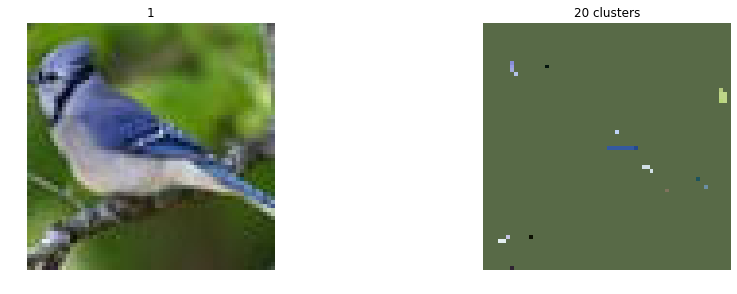

SSIM(original image, 20 clusters) = 0.2457875985571957


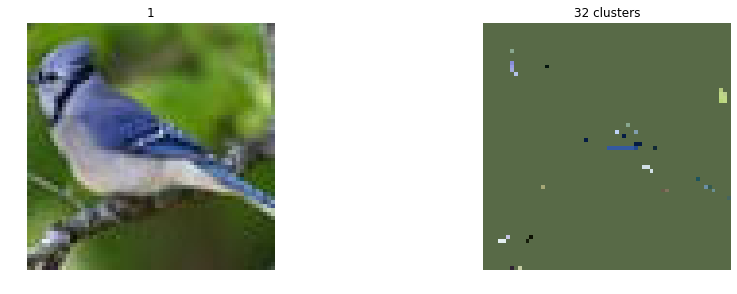

SSIM(original image, 32 clusters) = 0.2589786254352255


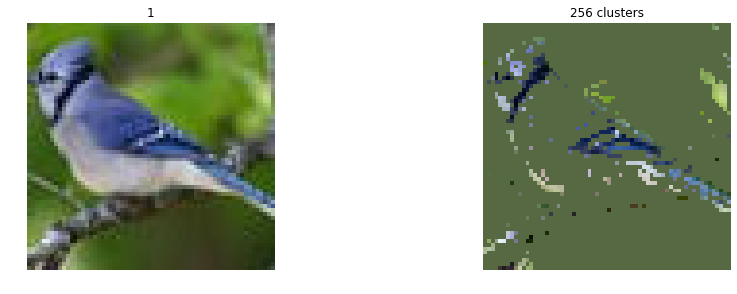

SSIM(original image, 256 clusters) = 0.42951140248077374


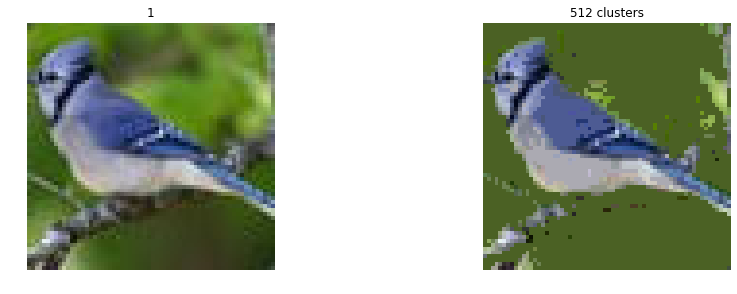

SSIM(original image, 512 clusters) = 0.7217022467666007


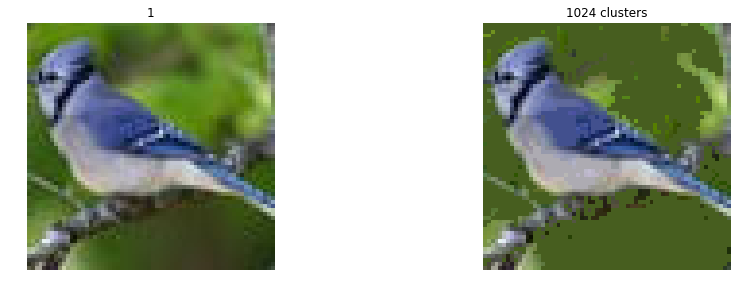

SSIM(original image, 1024 clusters) = 0.8156575069048416


In [122]:
# под попугайчиков нехватает памяти, из чего можно сделать вывод, что аггломеративная 
#кластеризация, мягко говоря, параша (вообще она нормальная, но не для картинок)

AC_size_data = np.array([2, 3, 10, 20, 32, 256, 512, 1024])

for i in range(len(AC_size_data)) :
    new_img = create_new_image(small_bird_img, AgglomerativeClustering(n_clusters=AC_size_data[i], linkage='single'))
    show_ssim(small_bird_img, new_img, str(AC_size_data[i]) + ' clusters')


In [124]:
'''
На основе проделанной работы могу сказать, что KMeans подходит для создания красивых картинок, а 
DBSCAN помогает определить расположение важного объекта на катртинке, но изображения становятся 
не очень красивыми. Аггломеративная кластериация, как я уже говорил - такая себе для кластеризации 
цветов.

выбирать наилучший алгоритм не имеет смысла, т. к для каждой задачи нужен свой алгоритм (главное не брать
аггломеративную)



'''

'\nНа основе проделанной работы могу сказать, что KMeans подходит для создания красивых картинок, а \nDBSCAN помогает определить расположение важного объекта на катртинке, но изображения становятся \nне очень красивыми. Аггломеративная кластериация, как я уже говорил - такая себе для кластеризации \nцветов.\n\nвыбирать наилучший алгоритм не имеет смысла, т. к для каждой задачи нужен свой алгоритм (главное не брать\nаггломеративную)\n\n\n\n'

# 2 - Уменьшение размерности помогает классификации лиц (суммарно 6 баллов)

Используя методы уменьшения размерности признаков, решите с максимальным **accuracy** задачу классификации лиц знаменитостей (датасет старый, неудивительно, если вы из всех знаменитостей будете знать только Буша и Шварценнегера).

Попробуйте добиться максимального accuracy (2 балла)
* без уменьшения размерности
* с уменьшением размерности

Возможно без уменьшения размерности у вас даже просто не получится дождаться времени работы на 11750 признаках. Я слышал у кого-то получилось, у меня нет.

Сравните ваш результат с константным предсказанием "всегда самый популярный класс". Делает ли ваша модель какой-то значительный прогресс? (1 балл)

Нарисуйте несколько лиц, на которых ваш алгоритм ошибся, подпишите правильный ответ и ваш ответ. (1 балл)

Напишите, каким алгоритмом вы воспользовались (PCA или TSNE), почему не другим? Обоснуйте ответ. (1 балл)

Визуализируйте датасет на плоскости. Подпишите несколько самых больших классов именами людей. Чем вы воспользуетесь, PCA или TSNE? Обоснуйте ответ (1 балл)

Скачивание данных и вспомогательная функция визуализации лиц уже есть:

In [3]:
import warnings
warnings.filterwarnings("ignore")

from sklearn.datasets import fetch_lfw_people
lfw_people = fetch_lfw_people(min_faces_per_person=30, resize=1.0)
# эту строчку менять нельзя, ресайзить нельзя

In [4]:
from sklearn.model_selection import train_test_split
X = lfw_people.data
y = lfw_people.target
names = lfw_people.target_names

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.2, random_state=42)
# эту строчку тоже менять нельзя'

In [6]:
X.shape # 2370 лиц, каждый из них представляется вектором размера 11750

(2370, 11750)

In [7]:
y.shape

(2370,)

In [8]:
names[8] # в y лежат номера, а names переводит номер в имя

'George W Bush'

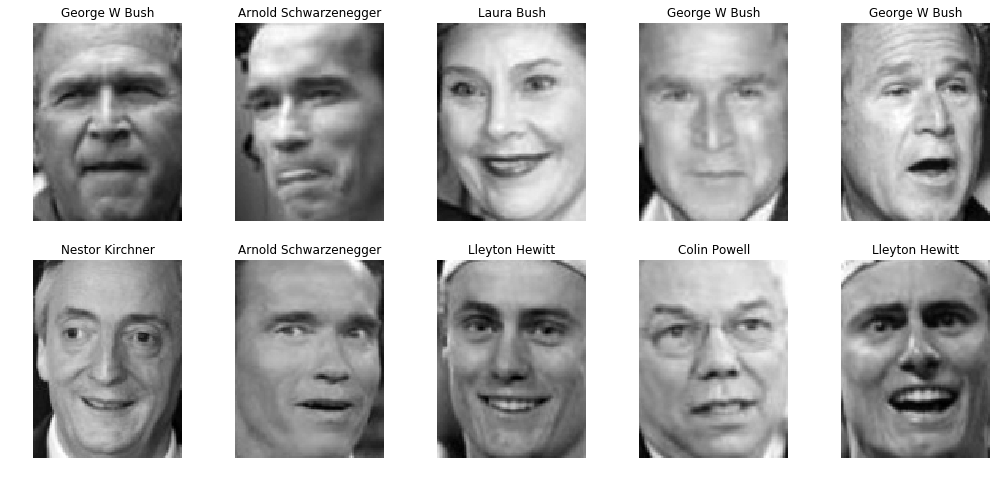

In [56]:
import matplotlib.pyplot as plt
def plot_image(image_id):
    # функция рисует изображение номер image_id
    plt.title(names[y[image_id]])
    plt.imshow(255 - lfw_people['images'][image_id], cmap=plt.cm.gray_r, interpolation='nearest')
    
def plot_grid(image_ids, nrows, ncols):
    # функция рисует изображения с id равными image_ids
    # в nrows рядов и ncols столбцов
    fig = plt.gcf()
    fig.set_size_inches(17.5, 8)
    for index, example_id in enumerate(image_ids):
        plt.subplot(nrows, ncols, index + 1)
        plot_image(example_id)
        plt.axis('off')

plot_grid(range(10), nrows=2, ncols=5)# первые 10 лиц

In [10]:
from matplotlib.colors import Normalize
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [16]:
#n_people = int(len(y)/30)

def show_diagram(X, y, title_text):
    n_peoples = int(len(y)/30)
  
    plt.figure(figsize=(20, 12))
    for people in range(n_peoples):
        norm = Normalize(vmin=0, vmax=n_peoples) # для красивых цветов
        color = plt.cm.gist_ncar(norm(people))
        plt.scatter(X[:, 0][y == people],
                    X[:, 1][y == people],
                    c=[color] * len(X[:, 0][y == people]), label=people, edgecolor='face', s=50)
    plt.title(title_text, fontsize=20)
    #plt.legend()

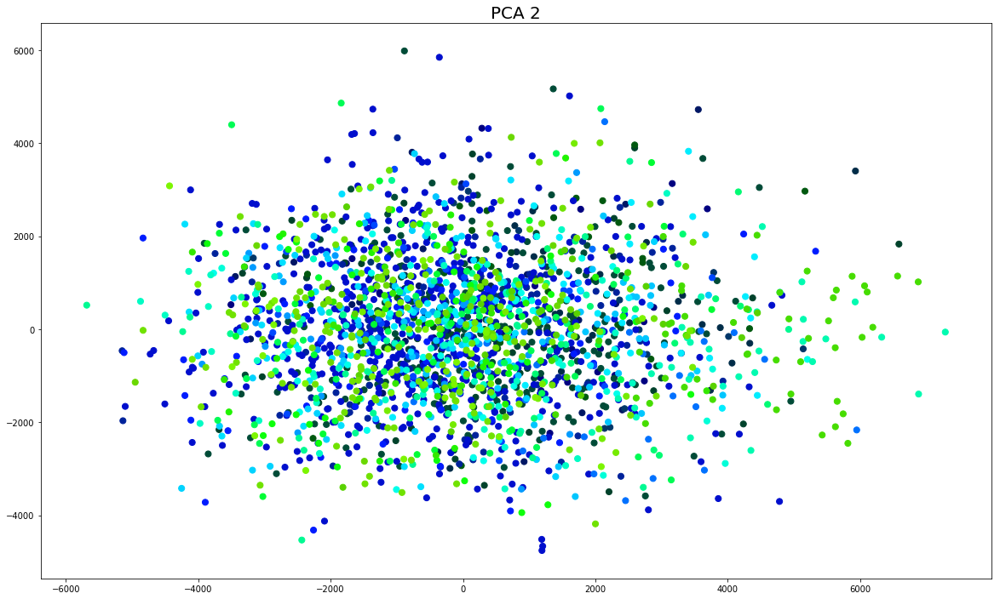

In [17]:
pca_2 = PCA(n_components=2)
X_pca_2 = pca_2.fit(X).transform(X)
show_diagram(X_pca_2, y, 'PCA 2')

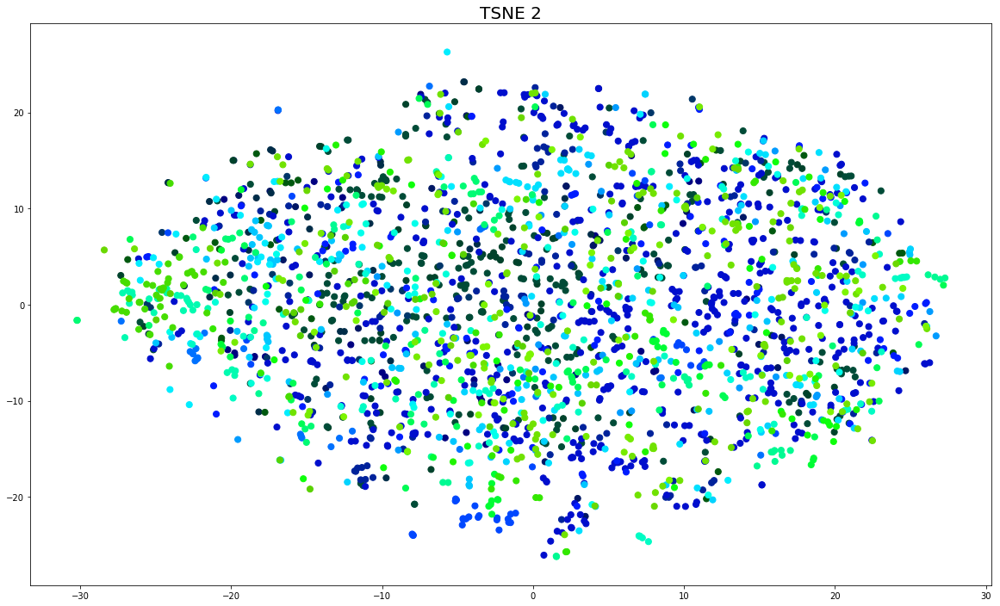

In [18]:
tsne_2 = TSNE(n_components=2, n_iter=400)
X_tsne_2 = tsne_2.fit_transform(X)
show_diagram(X_tsne_2, y, 'TSNE 2')

In [19]:
import warnings
warnings.filterwarnings("ignore")

from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.linear_model import LogisticRegression


In [20]:
#  так и не дождался

#print('accuracy for raw data is {}'.format(cross_val_score(LogisticRegression(),
 #                                                          X, y,
  #                                                         scoring='accuracy').mean()))
  
print('accuracy for data transormed by PCA-2D is {}'.format(cross_val_score(LogisticRegression(),
                                                                            X_pca_2, y,
                                                                            scoring='accuracy').mean()))
print('accuracy for data transormed by tSNE-2D is {}'.format(cross_val_score(LogisticRegression(),
                                                                             X_tsne_2, y,
                                                                             scoring='accuracy').mean()))

accuracy for data transormed by PCA-2D is 0.23293906577365062
accuracy for data transormed by tSNE-2D is 0.23377239910698397


In [21]:
import numpy as np

n_comp_data = np.arange(1, 100, 10)

pcas = []
X_pcas = []
acc_pcas = []

for i in range(len(n_comp_data)):
    n_comp = n_comp_data[i]
    pcas.append(PCA(n_components=n_comp))
    X_pcas.append(pcas[i].fit(X).transform(X))
    acc_pcas.append(cross_val_score(LogisticRegression(), X_pcas[i], y, scoring='accuracy').mean())
    print('accuracy for data transormed by PCA-{}D is {}'.format(n_comp, acc_pcas[i]))

accuracy for data transormed by PCA-1D is 0.23378188077575765
accuracy for data transormed by PCA-11D is 0.32674937803174026
accuracy for data transormed by PCA-21D is 0.43969039802181903
accuracy for data transormed by PCA-31D is 0.5409759836943968
accuracy for data transormed by PCA-41D is 0.581077461622976
accuracy for data transormed by PCA-51D is 0.6080872961326259
accuracy for data transormed by PCA-61D is 0.6371402754133336
accuracy for data transormed by PCA-71D is 0.6363064308732115
accuracy for data transormed by PCA-81D is 0.6434778723194777
accuracy for data transormed by PCA-91D is 0.6371118304070126


In [22]:
# при количестве измерений, близкому к 80 находится наилучший результат

In [23]:
n_comp_data = np.arange(73, 87, 1)

pcas = []
X_pcas = []
acc_pcas = []

for i in range(len(n_comp_data)):
    n_comp = n_comp_data[i]
    pcas.append(PCA(n_components=n_comp))
    X_pcas.append(pcas[i].fit(X).transform(X))
    acc_pcas.append(cross_val_score(LogisticRegression(), X_pcas[i], y, scoring='accuracy').mean())
    print('accuracy for data transormed by PCA-{}D is {}'.format(n_comp, acc_pcas[i]))

accuracy for data transormed by PCA-73D is 0.6426250644418082
accuracy for data transormed by PCA-74D is 0.6379900931370083
accuracy for data transormed by PCA-75D is 0.6375634335947791
accuracy for data transormed by PCA-76D is 0.6409304639756092
accuracy for data transormed by PCA-77D is 0.635467628438677
accuracy for data transormed by PCA-78D is 0.6359381949639911
accuracy for data transormed by PCA-79D is 0.6438448687550952
accuracy for data transormed by PCA-80D is 0.6338069420800003
accuracy for data transormed by PCA-81D is 0.6426462896665363
accuracy for data transormed by PCA-82D is 0.6438803164829837
accuracy for data transormed by PCA-83D is 0.6434978580706029
accuracy for data transormed by PCA-84D is 0.6426503022341089
accuracy for data transormed by PCA-85D is 0.644660989431273
accuracy for data transormed by PCA-86D is 0.642976598900662


In [42]:
n_comp_data = np.array([1, 2, 3])

tsnes = []
X_tsnes = []
acc_tsnes = []

for i in range(len(n_comp_data)):
    n_comp = n_comp_data[i]
    tsnes.append(TSNE(n_components=n_comp, n_iter=300))
    X_tsnes.append(tsnes[i].fit_transform(X))
    acc_tsnes.append(cross_val_score(LogisticRegression(), X_tsnes[i], y, scoring='accuracy').mean())
    print('accuracy for data transormed by tSNE-{}D is {}'.format(n_comp, acc_tsnes[i]))


accuracy for data transormed by tSNE-1D is 0.23336397463548794
accuracy for data transormed by tSNE-2D is 0.23672575297514234
accuracy for data transormed by tSNE-3D is 0.2261942838696136


In [98]:
from collections import Counter

acc_const = np.mean(y == max(Counter(y)))
print('const predict accuracy = {}'.format(acc_const))

const predict accuracy = 0.02067510548523207


In [99]:
# Как видим, предсказание с использованием самого популярного класса не очень эффиктивно

In [100]:
pca_85 = PCA(n_components=85)
X_pca_85 = pca_85.fit(X).transform(X)
X_trans = X_pca_85

model = LogisticRegression()
X_trans_train, X_trans_test, y_trans_train, y_trans_test = train_test_split(X_trans, y, random_state=42)
model.fit(X_trans_train, y_trans_train)
y_pred = model.predict(X_trans_test)


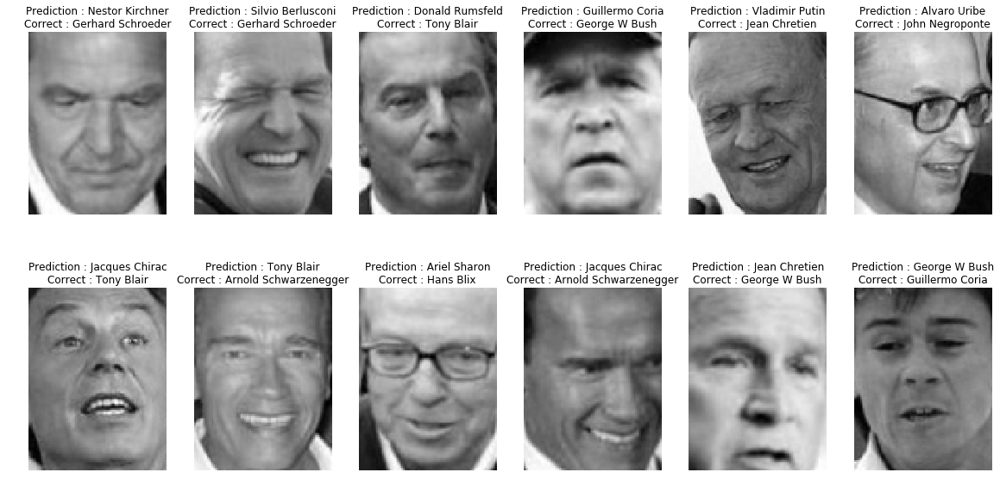

In [102]:
errors = (y_pred != y_trans_test)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

num_faces=12
plt.figure(figsize=(20, 10))
faces = X_test[errors][:num_faces]
for i, face in enumerate(faces):
    plt.subplot(2, len(faces)/2, i + 1)
    plt.title('Prediction : {}\nCorrect : {}'.format(names[y_pred[errors][i]], names[y_test[errors][i]]))
    plt.imshow(255 - face.reshape(125, 94), cmap=plt.cm.gray_r, interpolation='nearest')
    plt.axis('off')

In [103]:
''' 
Я воспользовался методом PCA, а не tSNE, так как tSNE, вопервых, очень долго считается, а вовторых,
уменьшает только до 2 и 3 размерности, а для задачи кластеризации картинок нужно большое колличество компонент 
(я использовал PCA с 85 компонентами)
'''

' \nЯ воспользовался методом PCA, а не tSNE, так как tSNE, вопервых, очень долго считается, а вовторых,\nуменьшает только до 2 и 3 размерности, а для задачи кластеризации картинок нужно большое колличество компонент \n(я использовал PCA с 85 компонентами)\n'